# Diabetes Prediction using Deep Learning

This project aims to predict diabetes diagnosis using a deep learning model. It covers the entire machine learning pipeline, from initial data loading and exploratory data analysis to advanced preprocessing, model training with cross-validation, and experiment tracking using Comet.ml.

The notebook is structured into logical sections, each with a clear purpose:

*   **Initial Setup and Data Loading**: Loading the dataset and initial data separation.
*   **Data Overview and Exploration**: Understanding data distributions and relationships.
*   **Preprocessing and Feature Engineering**: Preparing data for model input through encoding and scaling.
*   **Experiment Tracking with Comet.ml**: Setting up logging for model experiments.
*   **Configuration and Utility Functions**: Defining global parameters and helper functions.
*   **Data Transformation Class**: Encapsulating the full preprocessing pipeline.
*   **Deep Learning Model Architecture (MLP)**: Defining the neural network structure.
*   **Model Training and Evaluation Function**: Implementing the training loop for a single fold.
*   **Cross-Validation and Main Execution**: Orchestrating the full training and prediction pipeline.
*   **Final Experiment Log**: Ensuring all experiment data is logged to Comet.ml.

In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv('train.csv', index_col='id')
y = df['diagnosed_diabetes']
X = df.drop('diagnosed_diabetes', axis=1)
df.head()

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,...,gender,ethnicity,education_level,income_level,smoking_status,employment_status,family_history_diabetes,hypertension_history,cardiovascular_history,diagnosed_diabetes
id,,,,,,,,,,,,,,,,,,,,,
0,31,1,45,7.7,6.8,6.1,33.4,0.93,112,70,...,Female,Hispanic,Highschool,Lower-Middle,Current,Employed,0,0,0,1.0
1,50,2,73,5.7,6.5,5.8,23.8,0.83,120,77,...,Female,White,Highschool,Upper-Middle,Never,Employed,0,0,0,1.0
2,32,3,158,8.5,7.4,9.1,24.1,0.83,95,89,...,Male,Hispanic,Highschool,Lower-Middle,Never,Retired,0,0,0,0.0
3,54,3,77,4.6,7.0,9.2,26.6,0.83,121,69,...,Female,White,Highschool,Lower-Middle,Current,Employed,0,1,0,1.0
4,54,1,55,5.7,6.2,5.1,28.8,0.90,108,60,...,Male,White,Highschool,Upper-Middle,Never,Retired,0,1,0,1.0


In [ ]:
df['diagnosed_diabetes'].value_counts()

,count
diagnosed_diabetes,
1.0,436307
0.0,263693


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 700000 entries, 0 to 699999
Data columns (total 25 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 700000 non-null  int64  
 1   alcohol_consumption_per_week        700000 non-null  int64  
 2   physical_activity_minutes_per_week  700000 non-null  int64  
 3   diet_score                          700000 non-null  float64
 4   sleep_hours_per_day                 700000 non-null  float64
 5   screen_time_hours_per_day           700000 non-null  float64
 6   bmi                                 700000 non-null  float64
 7   waist_to_hip_ratio                  700000 non-null  float64
 8   systolic_bp                         700000 non-null  int64  
 9   diastolic_bp                        700000 non-null  int64  
 10  heart_rate                          700000 non-null  int64  
 11  cholesterol_total              

In [ ]:
y = y.astype('int')

### Preprocessing and Feature Engineering

This section covers data preprocessing steps, including encoding categorical features using `OrdinalEncoder` and scaling numerical features using `RobustScaler` within the `Transform` class. It also generates a correlation heatmap to visualize relationships between features and the target variable after initial encoding.

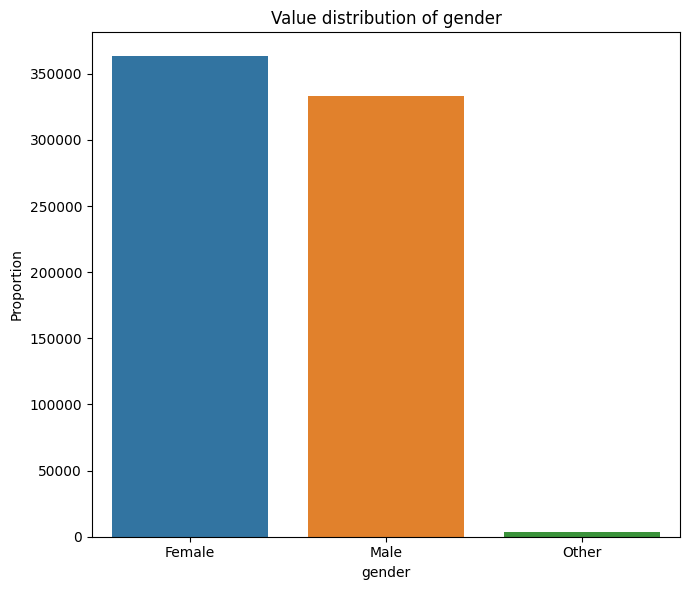

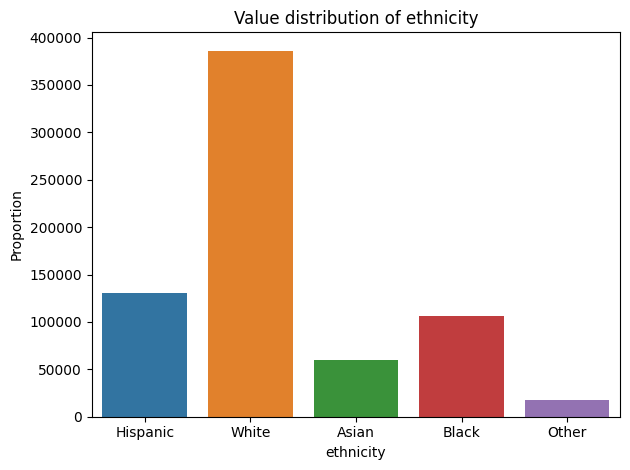

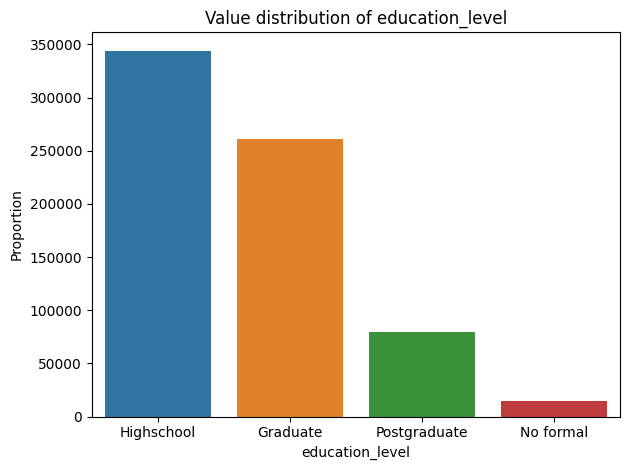

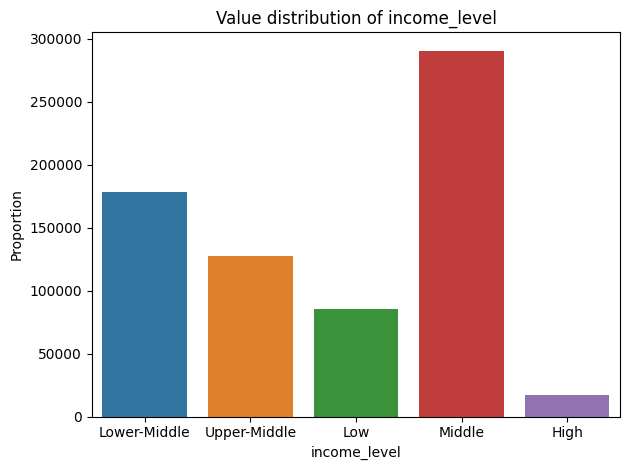

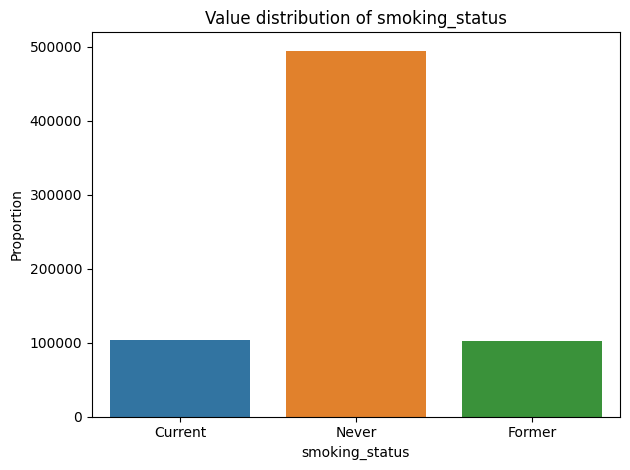

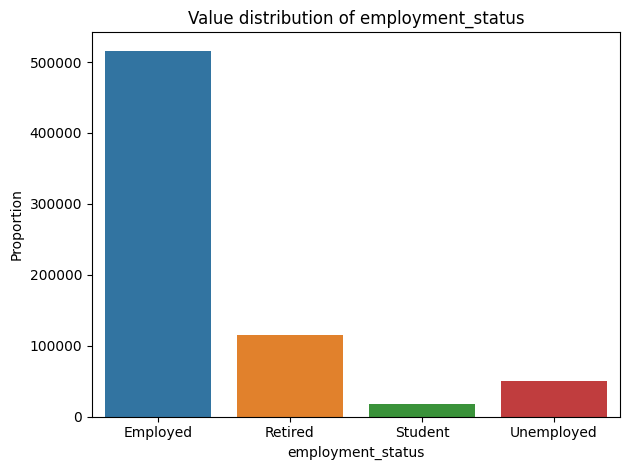

In [ ]:
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

num_features = X.select_dtypes(include=['number']).columns
cat_features = X.select_dtypes(include=['object']).columns

plt.figure(figsize=(7,6))

for feature in cat_features:
  sns.countplot(df, x=feature, hue=feature)
  plt.title(f'Value distribution of {feature}')
  plt.xlabel(f'{feature}')
  plt.ylabel('Proportion')
  plt.tight_layout()
  plt.show()

In [ ]:
import plotly.graph_objects as go

colors = ['#f6f5f5', '#fe346e', '#512b58', '#2c003e']

income_level_values = df['income_level'].value_counts()
income_level_bar = go.Figure(go.Bar(y=income_level_values.index, x=income_level_values.values, orientation='h',
    marker=dict(color=income_level_values.values,
      colorscale=[[0, colors[2]], [0.5, colors[1]], [1, colors[3]]], showscale=False),
    text=[f"{val} people" for val in income_level_values.values], textposition='outside'))
income_level_bar.show()

In [ ]:
employment_status_values = df['employment_status'].value_counts()
employment_status_bar = go.Figure(go.Bar(y=employment_status_values.index, x=employment_status_values.values, orientation='h',
    marker=dict(color=employment_status_values.values,
      colorscale=[[0, colors[2]], [0.5, colors[1]], [1, colors[3]]], showscale=False),
    text=[f"{val} people" for val in employment_status_values.values], textposition='outside'))
employment_status_bar.show()

In [ ]:
ethnicity_values = df['ethnicity'].value_counts()
ethnicity_bar = go.Figure(go.Bar(y=ethnicity_values.index, x=ethnicity_values.values, orientation='h',
    marker=dict(color=ethnicity_values.values,
      colorscale=[[0, colors[2]], [0.5, colors[1]], [1, colors[3]]], showscale=False),
    text=[f"{val} people" for val in ethnicity_values.values], textposition='outside'))
ethnicity_bar.show()

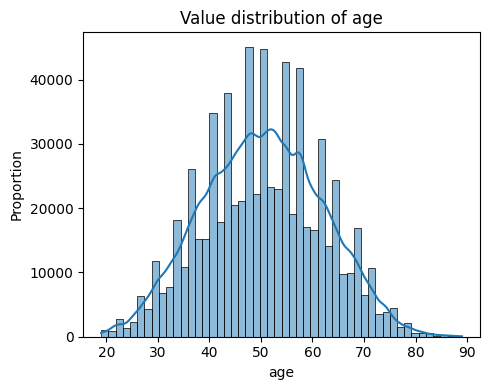

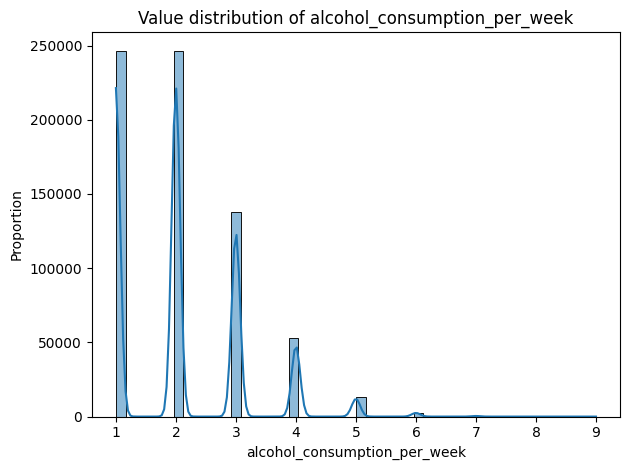

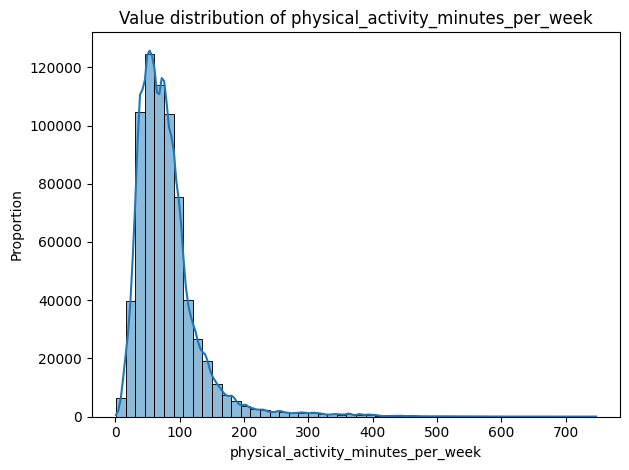

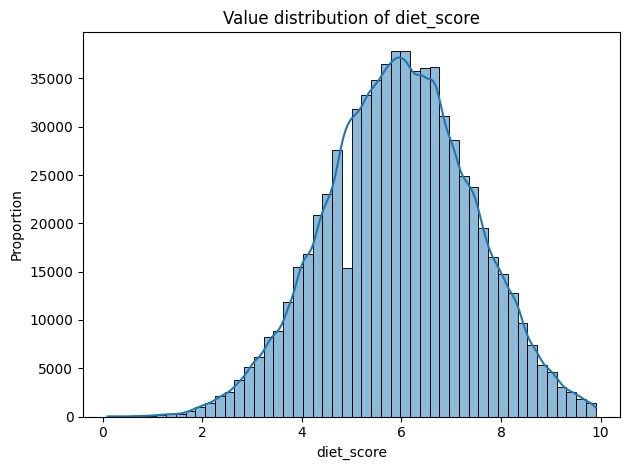

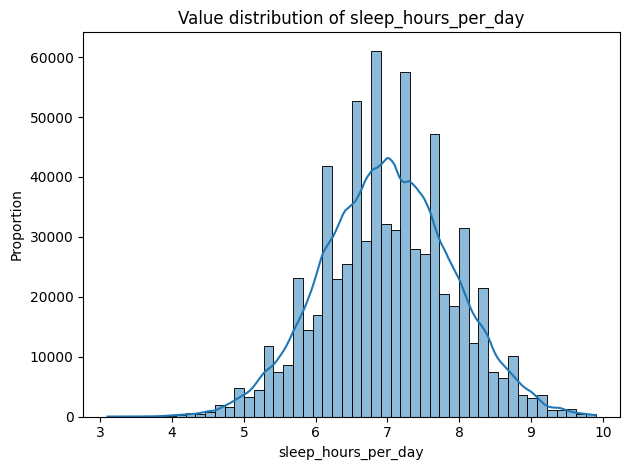

...

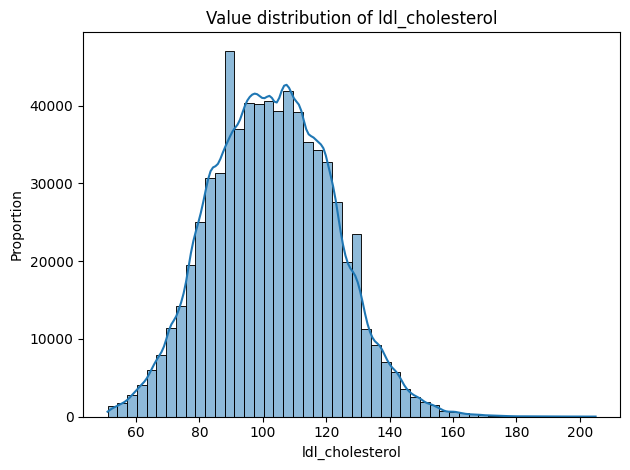

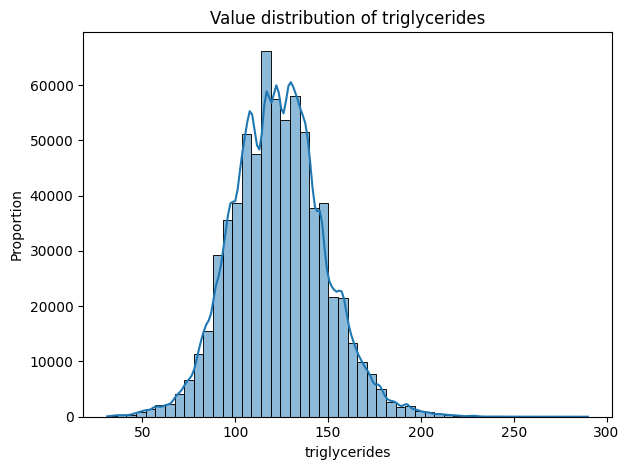

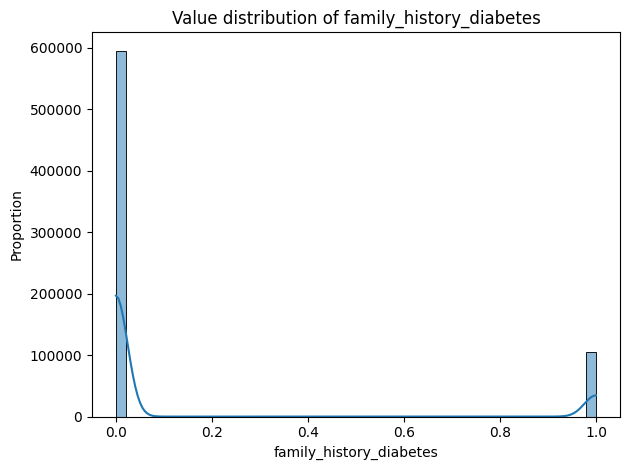

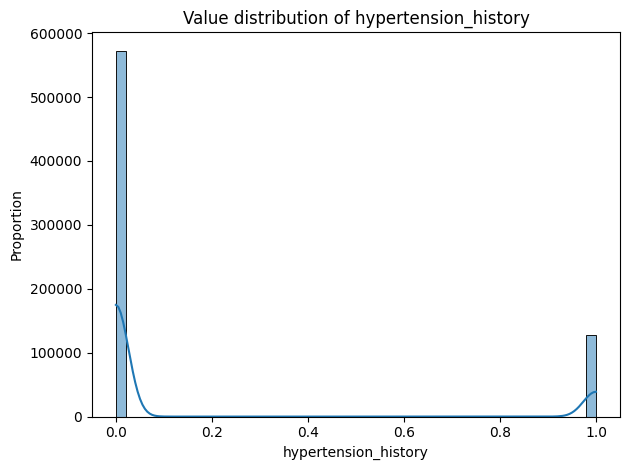

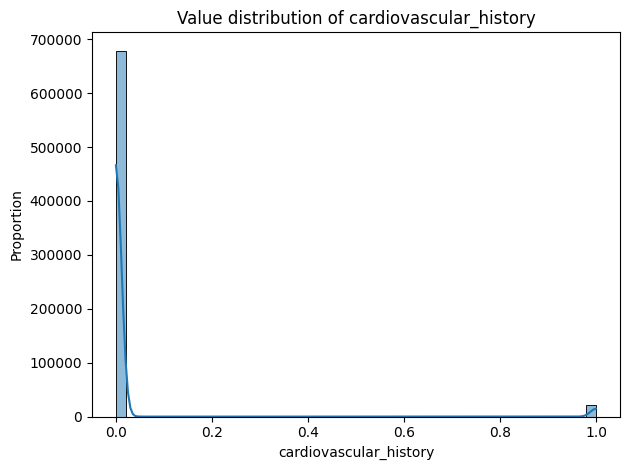

In [ ]:
plt.figure(figsize=(5,4))

for i, feature in enumerate(num_features):
  sns.histplot(df, x=feature, kde=True, bins=50)
  plt.title(f'Value distribution of {feature}')
  plt.xlabel(f'{feature}')
  plt.ylabel('Proportion')
  plt.tight_layout()
  plt.show()

In [ ]:
alcohol_consumption_values = df['alcohol_consumption_per_week'].value_counts()
alcohol_consumption_bar = go.Figure(go.Bar(y=alcohol_consumption_values.index, x=alcohol_consumption_values.values, orientation='h',
    marker=dict(color=alcohol_consumption_values.values,
      colorscale=[[0, colors[2]], [0.5, colors[1]], [1, colors[3]]], showscale=False),
    text=[f"{val} people" for val in alcohol_consumption_values.values], textposition='outside'))
alcohol_consumption_bar.show()

In [ ]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=1, subplot_titles=('BMI Distribution'))

for status in [0, 1]:
    subset = df[df['diagnosed_diabetes'] == status]
    fig.add_trace(go.Histogram(x=subset['bmi'],
        name='Not Diagnosed' if status == 0 else 'Diagnosed',
        marker_color=colors[1] if status == 0 else colors[2], opacity=0.7), row=1, col=1)
fig.show()

In [ ]:
fig_systolic = make_subplots(rows=1, cols=1, subplot_titles=('Systolic BP Distribution'))

for status in [0, 1]:
    subset = df[df['diagnosed_diabetes'] == status]
    fig_systolic.add_trace(go.Histogram(x=subset['systolic_bp'],
        name='Not Diagnosed' if status == 0 else 'Diagnosed',
        marker_color=colors[1] if status == 0 else colors[2], opacity=0.7), row=1, col=1)
fig_systolic.show()

In [ ]:
fig_diastolic = make_subplots(rows=1, cols=1, subplot_titles='Diastolic BP Distribution')

for status in [0,1]:
  subset = df[df['diagnosed_diabetes'] == status]
  fig_diastolic.add_trace(go.Histogram(x=subset['diastolic_bp'],
                                       name='Not Diagnosed' if status == 0 else 'Diagnosed',
                                       marker_color=colors[1] if status == 0 else colors[2], opacity=0.7), row=1, col=1)
fig_diastolic.show()

In [ ]:
fig_cholesterol = make_subplots(rows=1, cols=1, subplot_titles='Cholesterol Total Distribution')
for status in [0,1]:
  subset = df[df['diagnosed_diabetes'] == status]
  fig_cholesterol.add_trace(go.Histogram(x=subset['cholesterol_total'],
                                         name='Not Diagnosed' if status == 0 else 'Diagnosed',
                                         marker_color=colors[1] if status == 0 else colors[2], opacity=0.7), row=1, col=1)
fig_cholesterol.show()

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

oe = OrdinalEncoder()
X[cat_features] = oe.fit_transform(X[cat_features]).astype('int')

X[cat_features].head()

,gender,ethnicity,education_level,income_level,smoking_status,employment_status
id,,,,,,
0,0,2,1,2,0,0
1,0,4,1,4,2,0
2,1,2,1,2,2,1
3,0,4,1,2,0,0
4,1,4,1,4,2,1


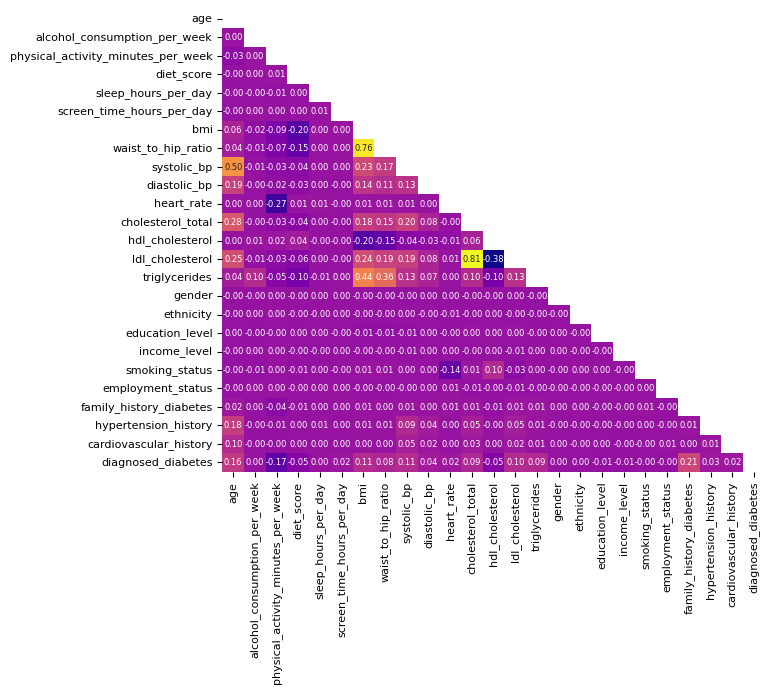

In [ ]:
combined_x_y = pd.concat([X, y], axis=1)

corr_combined_x_y = combined_x_y.corr()
mask = np.triu(corr_combined_x_y)

plt.figure(figsize=(7,6))
sns.heatmap(
    data=corr_combined_x_y,
    cmap='plasma',
    annot=True,
    cbar=False,
    mask=mask,
    annot_kws={'size': 6},
    fmt='.2f'
)
plt.xticks(fontsize=8) # Set x-axis label font size
plt.yticks(fontsize=8) # Set y-axis label font size
plt.show()

### Deep Learning Model Training

In [ ]:
pip install comet-ml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.9/780.9 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 42.1 MB/s eta 0:00:00
  Attempting uninstall: python-box
    Found existing installation: python-box 7.3.2
    Uninstalling python-box-7.3.2:
      Successfully uninstalled python-box-7.3.2


In [ ]:
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold
from itertools import combinations
import torch.nn as nn
import pandas as pd
import numpy as np
import warnings
import torch
from comet_ml import start
from comet_ml.integration.pytorch import log_model
from sklearn.preprocessing import OrdinalEncoder, RobustScaler
from tqdm import tqdm
from sklearn.decomposition import PCA

# Suppress warnings
warnings.filterwarnings("ignore")

In [ ]:
API_KEY = 'Your API Key'
experiment = start(
  api_key=API_KEY,
  project_name="diabetes-prediction-dl",
  workspace="dreadnought0073"
)

In [ ]:
class Config:
    target = 'diagnosed_diabetes'

    train = pd.read_csv('train.csv', index_col='id')
    test = pd.read_csv('test.csv', index_col='id')

    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    state = 42

    n_splits = 2

    early_stop = 20

    metric = 'roc_auc'

    task_type = "classification"

    task_is_regression = task_type == 'regression'

    outliers = False
    log_trf = False
    feature_eng = False
    missing = False
    training = True

In [ ]:
def roc_auc(y_true, y_preds):
  return roc_auc_score(y_true, y_preds)

In [ ]:
def set_seed(seed):
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.cuda.manual_seed_all(seed)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False

In [ ]:
class Transform(Config):
  def __init__(self):
    super().__init__()

    self.num_features = self.train.drop(self.target, axis=1).select_dtypes(include=['number']).columns.tolist()
    self.cat_features = self.train.drop(self.target, axis=1).select_dtypes(exclude=['number']).columns.tolist()

    if self.feature_eng:
      self.train = self.pca_engineering(self.train)
      self.test = self.pca_engineering(self.test)
    if self.missing:
      self.missing_values()
    if self.outliers:
      self.train = self.remove_outliers(self.train)
      self.test = self.remove_outliers(self.test)
    if self.log_trf:
      self.log_transformation()
    self.encode()

  def __call__(self):
    self.y = self.train[self.target]

    self.X = self.train.drop(self.target, axis=1)

    self.X_enc = self.train_enc.drop(self.target, axis=1)

    return self.X, self.X_enc, self.y, self.test, self.test_enc, self.cat_features, self.num_features

  def encode(self):
    self.train_enc = self.train.copy()
    self.test_enc = self.test.copy()

    data = pd.concat([self.train_enc, self.test_enc], axis=0)

    oe = OrdinalEncoder()
    data[self.cat_features] = oe.fit_transform(data[self.cat_features]).astype('int')

    scaler = RobustScaler()
    data[self.num_features] = scaler.fit_transform(data[self.num_features])

    self.train_enc = data[~data[self.target].isna()]
    self.test_enc = data[data[self.target].isna()].drop(self.target, axis=1)

  def pca_engineering(self, data):
    pca = PCA(n_components=14, random_state=self.state)
    data[self.num_features] = pca.fit_transform(data[self.num_features])
    return data

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_features, out_features, dropout):
        super().__init__()
        self.fc = nn.Linear(in_features, out_features)
        self.fc2 = nn.Linear(out_features, out_features)
        self.bn = nn.BatchNorm1d(out_features)
        self.relu = nn.ReLU()
        self.fc3 = nn.Linear(out_features, out_features)
        self.fc4 = nn.Linear(out_features, out_features)
        self.bn2 = nn.BatchNorm1d(out_features)
        self.gelu = nn.GELU()
        self.drop = nn.Dropout(dropout)
        self.shortcut = nn.Identity() if in_features == out_features else nn.Linear(in_features, out_features)

    def forward(self, x):
        out = self.fc(x)
        out = self.fc2(out)
        out = self.bn(out)
        out = self.relu(out)
        out = self.drop(out)
        out = self.fc3(out)
        out = self.fc4(out)
        out = self.bn2(out)
        out = self.gelu(out)
        out = self.drop(out)
        res = self.shortcut(x)
        return self.gelu(out + res)


class MLPRegressor(nn.Module):
    def __init__(self, in_features, hidden_dims, dropout):
        super().__init__()
        layers = []
        prev = in_features
        for h in hidden_dims:
          layers.append(ResidualBlock(prev, h, dropout))
          prev = h
        layers.append(nn.Linear(prev, 1))
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x).squeeze(1)

In [ ]:
def train_one_fold(X_tr, y_tr, X_va, y_va, count_values, params, epochs, batch_size, patience):
    ds_tr = TensorDataset(torch.from_numpy(X_tr).float(), torch.from_numpy(y_tr).float())
    ds_va = TensorDataset(torch.from_numpy(X_va).float(), torch.from_numpy(y_va).float())

    dl_tr = DataLoader(ds_tr, batch_size=batch_size, shuffle=True, pin_memory=True, num_workers=2, persistent_workers=True)

    dl_va = DataLoader(ds_va, batch_size=batch_size, shuffle=False, pin_memory=True, num_workers=1, persistent_workers=True)

    model = MLPRegressor(
        in_features=X_tr.shape[1],
        hidden_dims=params['hidden_dims'],
        dropout=params['dropout']
    ).to(Config.device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=params['lr'], weight_decay=params['weight_decay'])

    # Calculate pos_weight for BCEWithLogitsLoss to handle class imbalance
    # count_values[0] is negative class count, count_values[1] is positive class count
    pos_weight_value = torch.tensor(count_values[0] / count_values[1], dtype=torch.float32).to(Config.device)
    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight_value)

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min", patience=max(patience // 4, 10), factor=0.5
    )

    best_loss = float('inf')
    best_state = None
    no_improve = 0

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        for xb, yb in dl_tr:
          xb, yb = xb.to(Config.device), yb.to(Config.device)
          optimizer.zero_grad()
          preds = model(xb)
          loss = criterion(preds, yb)
          loss.backward()
          optimizer.step()
          train_loss += loss.item() * xb.size(0)

        train_loss /= len(ds_tr)
        experiment.log_metric("epoch train loss", train_loss)
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
          for xb, yb in dl_va:
            xb, yb = xb.to(Config.device), yb.to(Config.device)
            preds_model = model(xb)
            val_loss += criterion(preds_model, yb).item() * xb.size(0)
        val_loss /= len(ds_va)
        scheduler.step(val_loss)
        experiment.log_metric(f"epoch validation loss", val_loss)
        if (epoch + 1) % patience == 0:
          print(f"Epoch {epoch+1:4d} | Train Loss: {train_loss:.6f} | Val Loss: {val_loss:.6f}")

        if val_loss < best_loss:
          best_loss = val_loss
          best_state = {k: v.cpu() for k, v in model.state_dict().items()}
          no_improve = 0
        else:
          no_improve += 1
          if no_improve >= patience:
              print(f"Early stopping at epoch {epoch+1}, best val loss = {best_loss:.6f}")
              break

    model.load_state_dict({k: v.to(Config.device) for k,v in best_state.items()})
    model.eval()
    with torch.no_grad():
      # va_out_logits now contains raw logits
      va_out_logits = model(torch.from_numpy(X_va).float().to(Config.device)).cpu().numpy()
      # Apply sigmoid to convert logits to probabilities for ROC AUC calculation
      va_out_probs = torch.sigmoid(torch.from_numpy(va_out_logits)).numpy()

    metric_roc_auc = roc_auc(y_va, va_out_probs)
    experiment.log_metric("ROC AUC", metric_roc_auc)

    return va_out_probs, metric_roc_auc, model

In [ ]:
def fit_predict_cv(X, y, X_test, seed=42):
    set_seed(seed)

    count_values = y.value_counts()
    X_np = X.values.astype(np.float32)
    y_np = y.values.astype(np.float32)
    X_test_np = X_test.values.astype(np.float32)

    kf = KFold(n_splits=Config.n_splits, shuffle=True, random_state=seed)

    oof = np.zeros(len(X_np), dtype=np.float32)

    test_pred_logits = np.zeros(len(X_test_np), dtype=np.float32)

    params = {
        'hidden_dims': [1024, 512, 256, 128],
        'dropout': 0.4,
        'lr': 1e-2,
        'weight_decay': 1e-3
    }

    experiment.log_parameters(params)

    for fold, (train_idx, val_idx) in enumerate(kf.split(X_np, y_np)):
      print(f'Going through Fold {fold +1}')
      X_train_fold, y_train_fold = X_np[train_idx], y_np[train_idx]
      X_val_fold, y_val_fold = X_np[val_idx], y_np[val_idx]
      va_out_probs, fold_roc_auc, model = train_one_fold(X_train_fold, y_train_fold, X_val_fold, y_val_fold, count_values, params, epochs=2000, batch_size=768, patience=Config.early_stop)

      log_model(experiment, model=model, model_name="DiabetesPredictor")

      oof[val_idx] = va_out_probs
      with torch.no_grad():
        test_pred_logits += model(torch.from_numpy(X_test_np).float().to(Config.device)).cpu().numpy() / Config.n_splits

      print(f"Fold {fold+1} ROC AUC Score: {fold_roc_auc:.5f}")
      experiment.log_metric("Fold ROC AUC", fold_roc_auc)

    test_pred_probs = torch.sigmoid(torch.from_numpy(test_pred_logits)).numpy()

    oof_roc_auc = roc_auc_score(y_np, oof) # Directly using roc_auc_score to avoid overwritten global 'roc_auc' alias
    print(f"OOF ROC AUC Score: {oof_roc_auc:.5f}")
    experiment.log_metric("oof_roc_auc", oof_roc_auc)

    return oof, test_pred_probs, oof_roc_auc


def main():
    t = Transform()

    X, X_enc, y, test, test_enc, cat_features, num_features = t()

    oof_preds, test_preds, oof_roc_auc = fit_predict_cv(
        X_enc,
        y,
        test_enc,
        seed=Config.state
    )

In [ ]:
if __name__ == "__main__":
  main()

In [ ]:
experiment.end()